# Satellite Images of Water Bodies

1. Dataset<br>
A collection of water bodies images captured by the Sentinel-2 Satellite. Each image comes with a black and white mask where white represents water and black represents something else but water.<br>
Data comes from Kaggle: https://www.kaggle.com/datasets/franciscoescobar/satellite-images-of-water-bodies

2. Project<br>
The goal of this project was to use a standard U-net implementation for image segmentation, more specifically, to train the network to recognize and locate bodies of water on the image.


In [ ]:
    import os
    import numpy as np
    from tqdm import tqdm
    import cv2 as cv
    from PIL import Image
    import matplotlib.pyplot as plt
    from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

In [9]:
image_path = 'test/Water Bodies Dataset/Images/'
mask_path = 'test/Water Bodies Dataset/Masks/'
SIZE = 128

In [10]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 2841/2841 [00:10<00:00, 270.16it/s] 


In [ ]:
# Plot some images and its masks
plt.figure(figsize=(10,15))
for i in range(1,11):
  plt.subplot(5,2,i)

  if i%2!=0:
    id = np.random.randint(len(images))
    plt.imshow(images[id], cmap=None)
    plt.title('Original Image')
  elif i%2==0:
    plt.imshow(masks[id].reshape(128,128), cmap='gray')
    plt.title('Mask')

plt.tight_layout()
plt.show()

In [11]:
# Train test split
images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.25)

In [12]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [13]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

W0000 00:00:1731708886.142284  461636 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/stepep - accuracy: 0.5468 - loss: 0.60


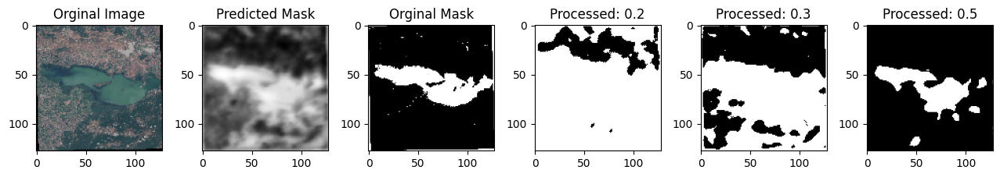

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - accuracy: 0.5472 - loss: 0.6032 - val_accuracy: 0.6199 - val_loss: 0.5315
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.6308 - loss: 0.513


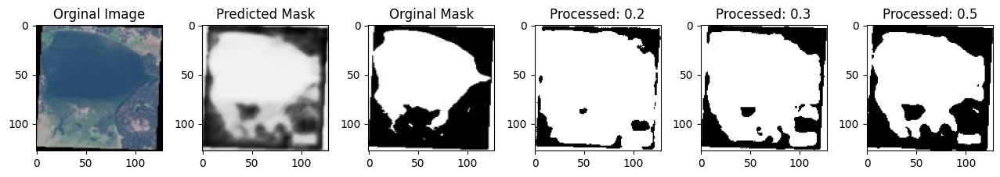

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - accuracy: 0.6309 - loss: 0.5127 - val_accuracy: 0.6408 - val_loss: 0.4769
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6626 - loss: 0.450


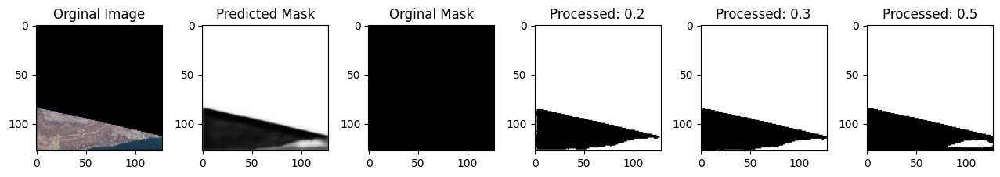

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.6626 - loss: 0.4502 - val_accuracy: 0.6604 - val_loss: 0.4501
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/steptep - accuracy: 0.6782 - loss: 0.420


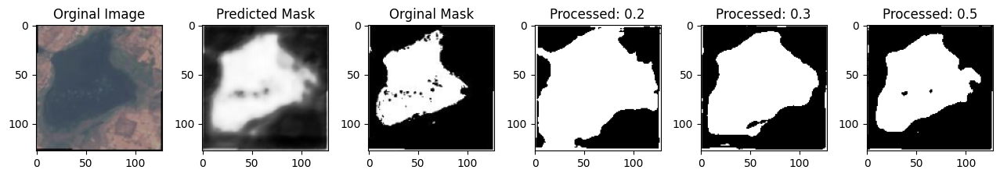

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.6781 - loss: 0.4206 - val_accuracy: 0.6785 - val_loss: 0.4148
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6808 - loss: 0.412


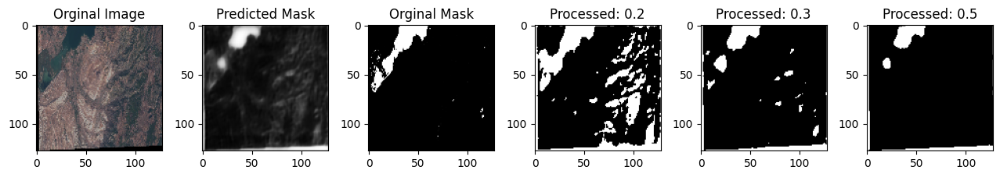

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 276ms/step - accuracy: 0.6807 - loss: 0.4126 - val_accuracy: 0.6806 - val_loss: 0.3993
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6849 - loss: 0.394


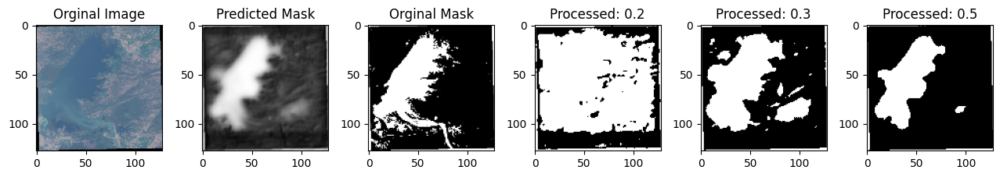

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.6848 - loss: 0.3947 - val_accuracy: 0.6555 - val_loss: 0.4401
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6792 - loss: 0.400


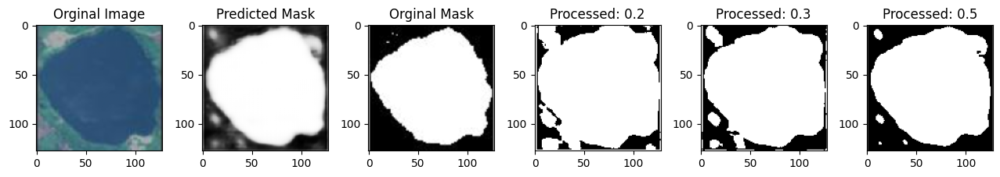

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 268ms/step - accuracy: 0.6792 - loss: 0.3999 - val_accuracy: 0.6887 - val_loss: 0.3831
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.6889 - loss: 0.384


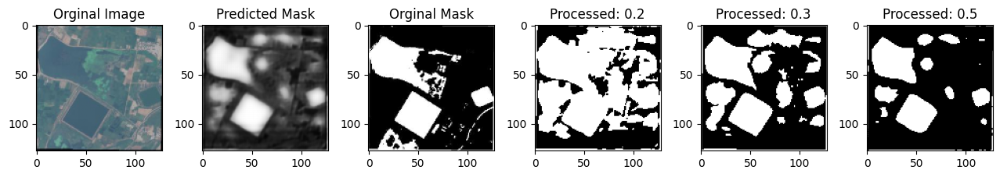

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 278ms/step - accuracy: 0.6889 - loss: 0.3847 - val_accuracy: 0.6846 - val_loss: 0.3863
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6871 - loss: 0.375


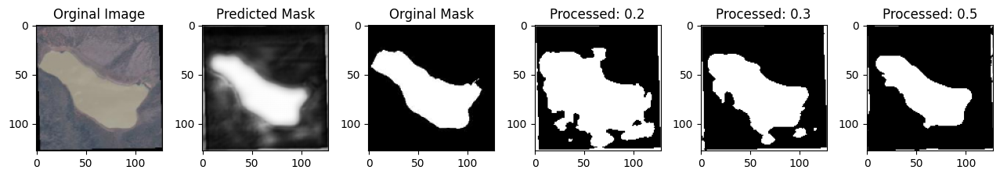

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.6871 - loss: 0.3755 - val_accuracy: 0.6882 - val_loss: 0.3816
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6890 - loss: 0.378


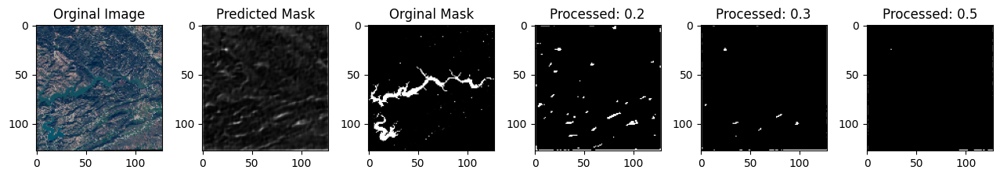

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 278ms/step - accuracy: 0.6890 - loss: 0.3788 - val_accuracy: 0.6900 - val_loss: 0.3742
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6948 - loss: 0.372


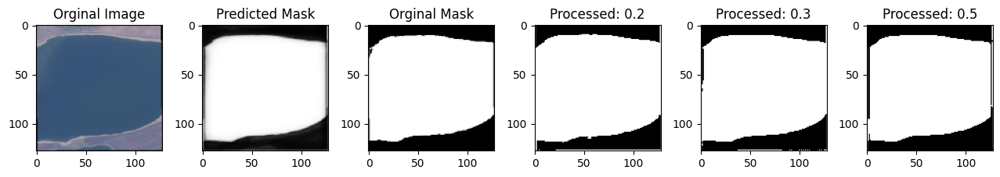

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.6948 - loss: 0.3725 - val_accuracy: 0.6850 - val_loss: 0.3932
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.6955 - loss: 0.363


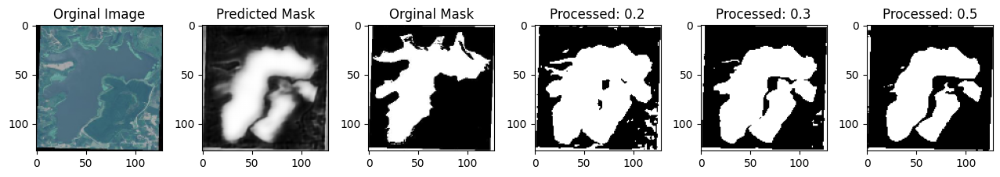

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - accuracy: 0.6955 - loss: 0.3635 - val_accuracy: 0.6878 - val_loss: 0.3711
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.6993 - loss: 0.350


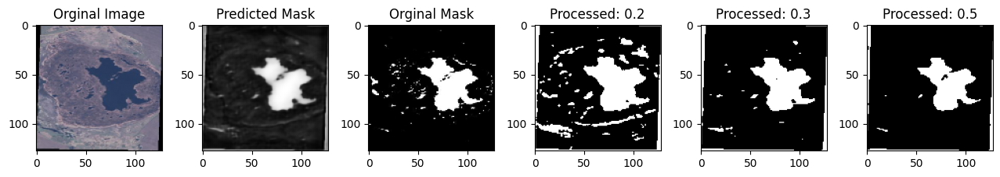

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 277ms/step - accuracy: 0.6992 - loss: 0.3503 - val_accuracy: 0.6915 - val_loss: 0.3694
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6893 - loss: 0.364


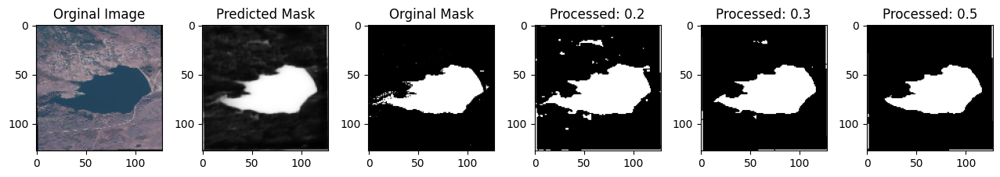

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.6894 - loss: 0.3642 - val_accuracy: 0.6913 - val_loss: 0.3660
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6940 - loss: 0.376


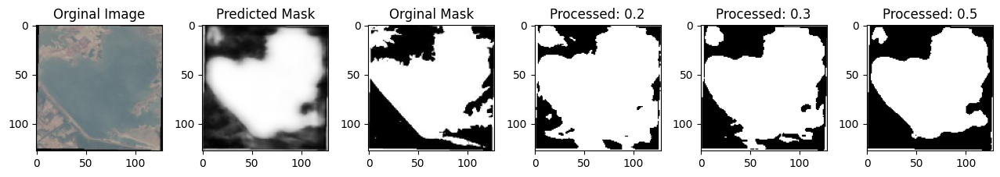

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - accuracy: 0.6940 - loss: 0.3764 - val_accuracy: 0.6921 - val_loss: 0.3653
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.6937 - loss: 0.369


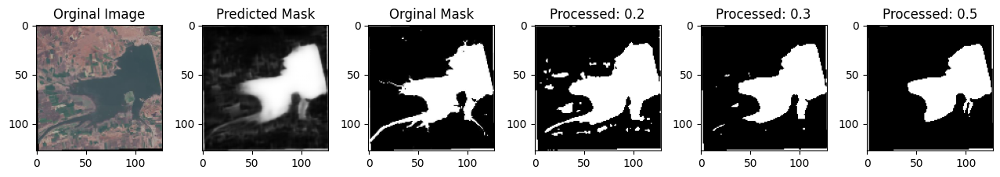

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - accuracy: 0.6938 - loss: 0.3695 - val_accuracy: 0.6957 - val_loss: 0.3547
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7000 - loss: 0.344


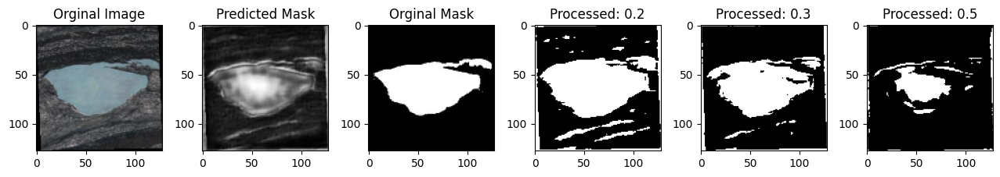

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - accuracy: 0.7000 - loss: 0.3447 - val_accuracy: 0.6964 - val_loss: 0.3487
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7023 - loss: 0.345


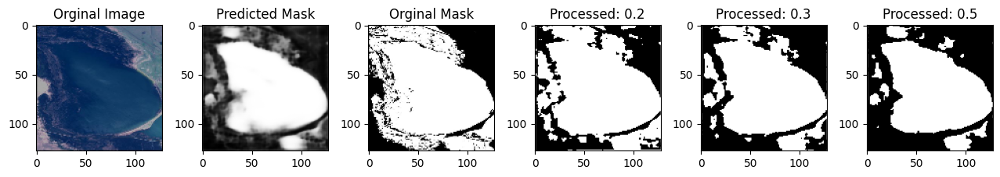

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 271ms/step - accuracy: 0.7023 - loss: 0.3459 - val_accuracy: 0.6984 - val_loss: 0.3499
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.6987 - loss: 0.346


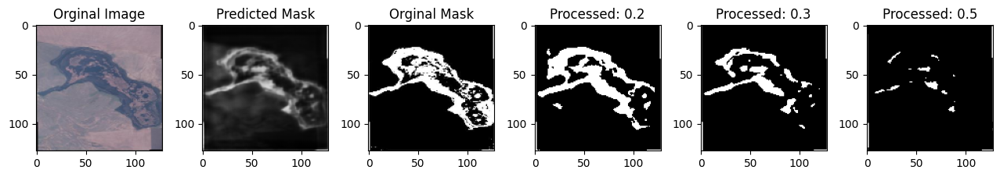

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.6987 - loss: 0.3461 - val_accuracy: 0.6957 - val_loss: 0.3539
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7036 - loss: 0.345


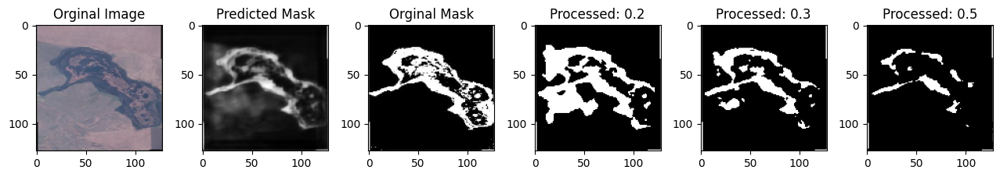

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7036 - loss: 0.3458 - val_accuracy: 0.6984 - val_loss: 0.3507
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7025 - loss: 0.344


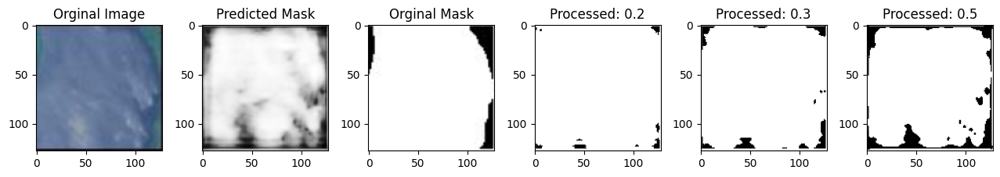

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7025 - loss: 0.3443 - val_accuracy: 0.6960 - val_loss: 0.3450
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7048 - loss: 0.339


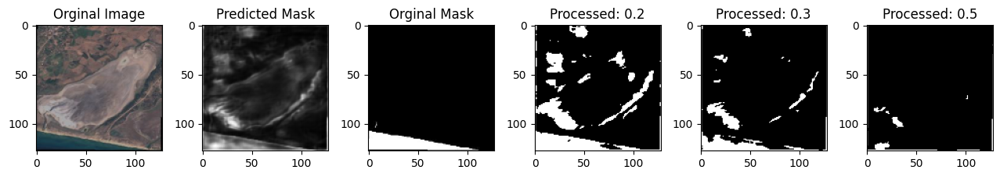

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7047 - loss: 0.3392 - val_accuracy: 0.6998 - val_loss: 0.3372
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7072 - loss: 0.323


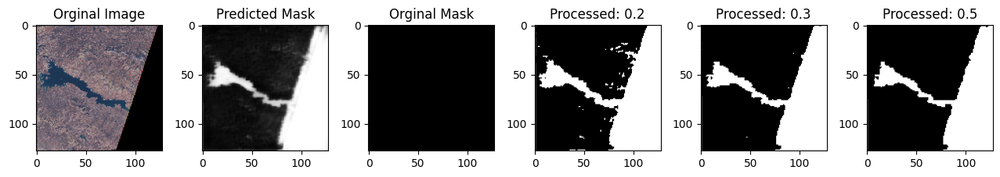

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7072 - loss: 0.3233 - val_accuracy: 0.6998 - val_loss: 0.3395
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7062 - loss: 0.331


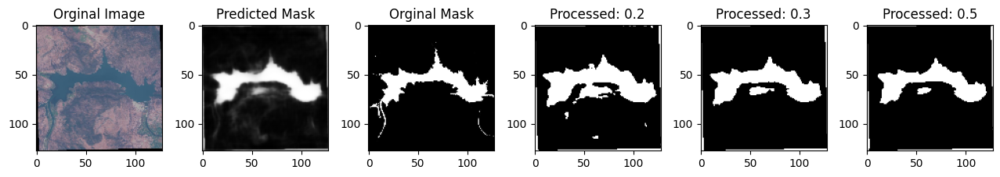

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7062 - loss: 0.3317 - val_accuracy: 0.7023 - val_loss: 0.3398
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7059 - loss: 0.327


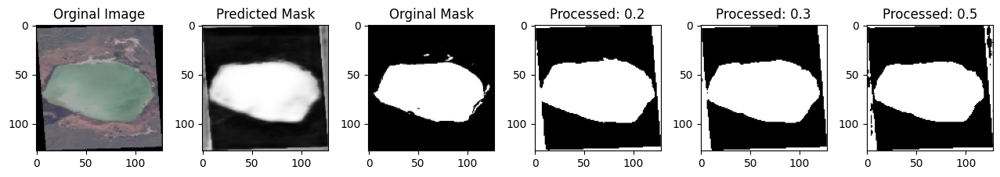

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7060 - loss: 0.3275 - val_accuracy: 0.7058 - val_loss: 0.3272
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7041 - loss: 0.332


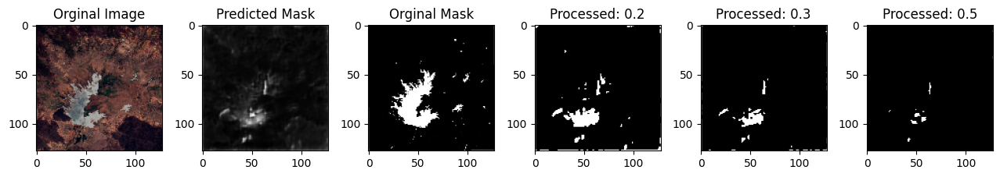

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 278ms/step - accuracy: 0.7042 - loss: 0.3321 - val_accuracy: 0.6956 - val_loss: 0.3553
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7007 - loss: 0.344


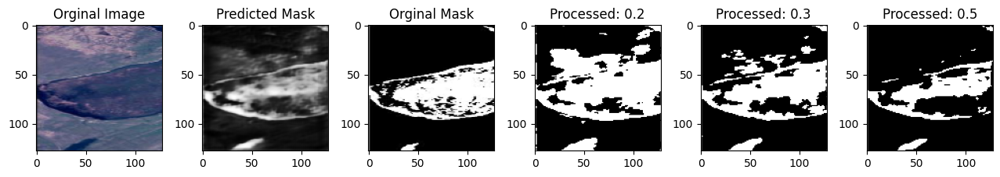

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - accuracy: 0.7008 - loss: 0.3447 - val_accuracy: 0.7051 - val_loss: 0.3337
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7050 - loss: 0.337


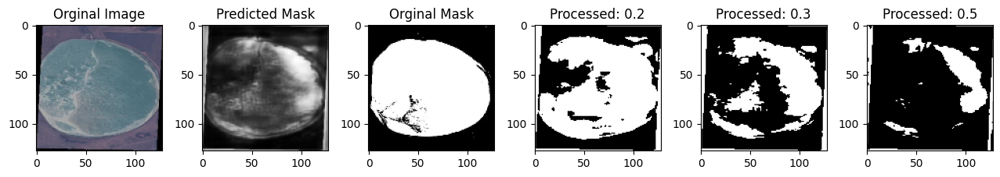

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - accuracy: 0.7050 - loss: 0.3371 - val_accuracy: 0.7049 - val_loss: 0.3258
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7081 - loss: 0.321


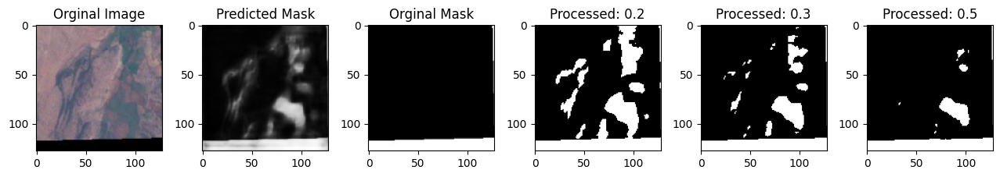

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7081 - loss: 0.3220 - val_accuracy: 0.7076 - val_loss: 0.3229
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7094 - loss: 0.321


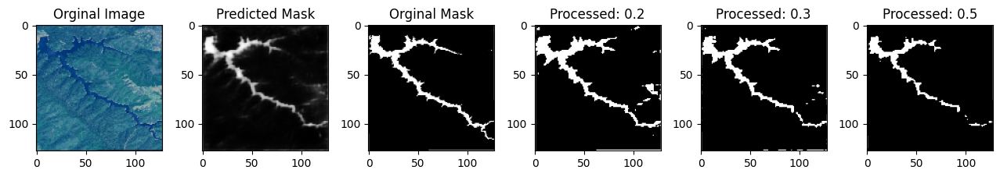

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7094 - loss: 0.3218 - val_accuracy: 0.7073 - val_loss: 0.3305
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7109 - loss: 0.318


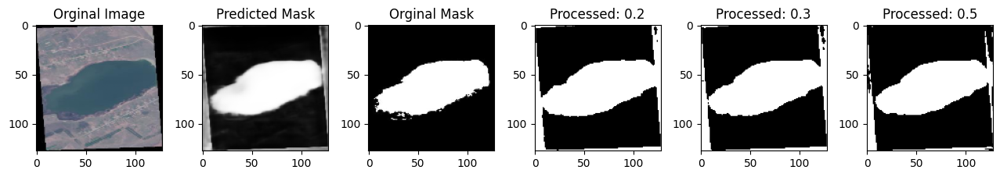

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7109 - loss: 0.3187 - val_accuracy: 0.7118 - val_loss: 0.3192
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7183 - loss: 0.312


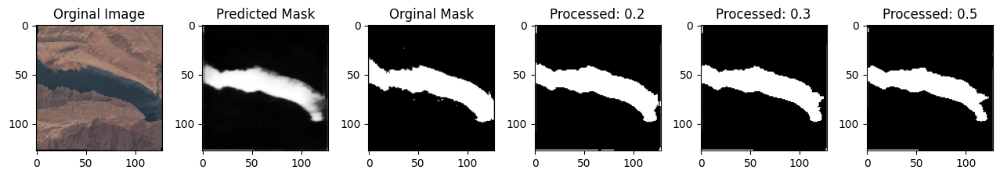

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7182 - loss: 0.3123 - val_accuracy: 0.7127 - val_loss: 0.3157
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7254 - loss: 0.305


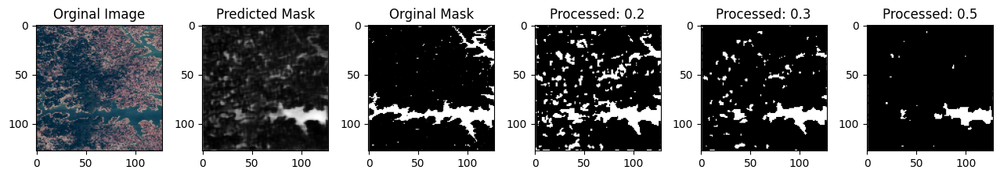

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7251 - loss: 0.3056 - val_accuracy: 0.7034 - val_loss: 0.3273
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7110 - loss: 0.311


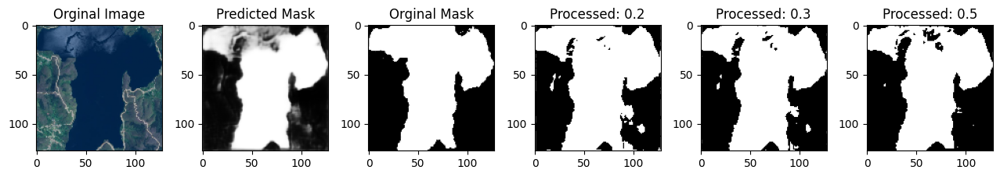

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7111 - loss: 0.3110 - val_accuracy: 0.7152 - val_loss: 0.3030
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7102 - loss: 0.306


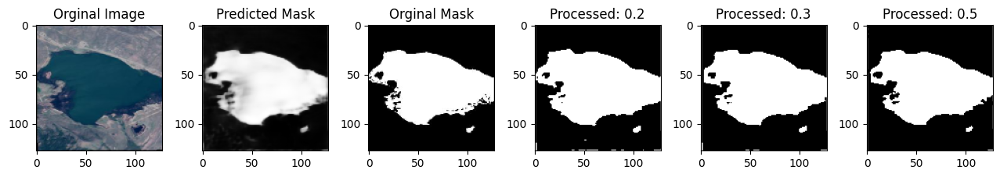

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7103 - loss: 0.3059 - val_accuracy: 0.7155 - val_loss: 0.3009
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7090 - loss: 0.365


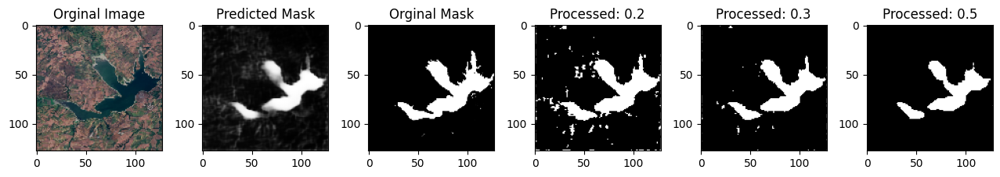

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7090 - loss: 0.3661 - val_accuracy: 0.7016 - val_loss: 0.3430
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7096 - loss: 0.330


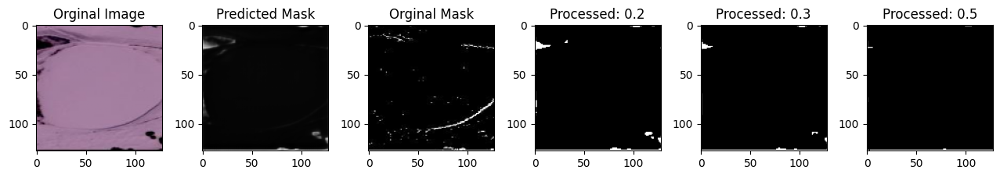

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7096 - loss: 0.3307 - val_accuracy: 0.7103 - val_loss: 0.3248
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7155 - loss: 0.310


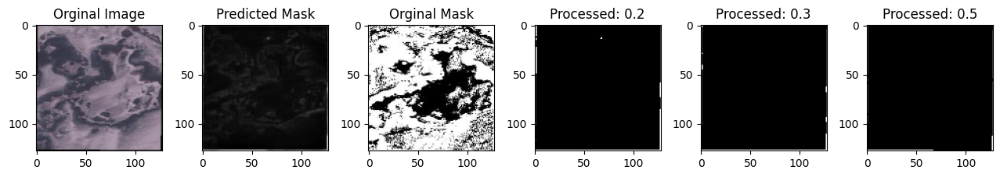

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7155 - loss: 0.3103 - val_accuracy: 0.7160 - val_loss: 0.3196
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7209 - loss: 0.305


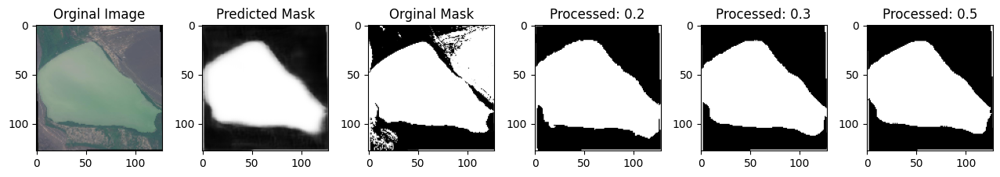

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - accuracy: 0.7208 - loss: 0.3055 - val_accuracy: 0.7126 - val_loss: 0.3163
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.7205 - loss: 0.299


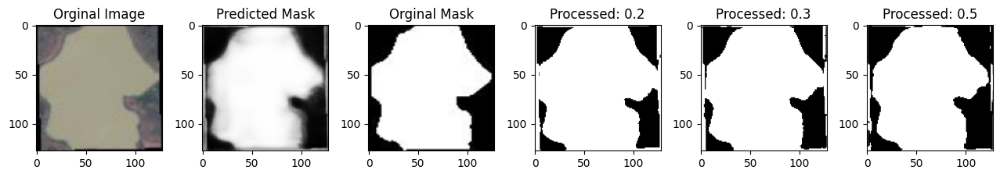

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7205 - loss: 0.2997 - val_accuracy: 0.7140 - val_loss: 0.3067
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7141 - loss: 0.302


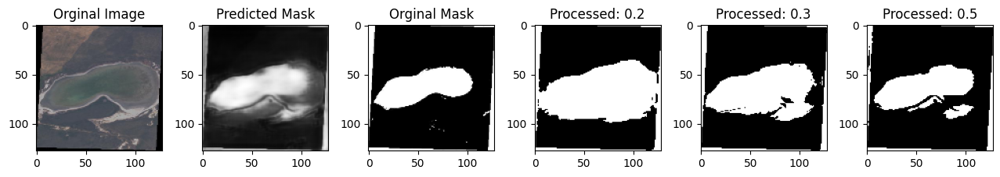

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7141 - loss: 0.3020 - val_accuracy: 0.7171 - val_loss: 0.2961
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7193 - loss: 0.299


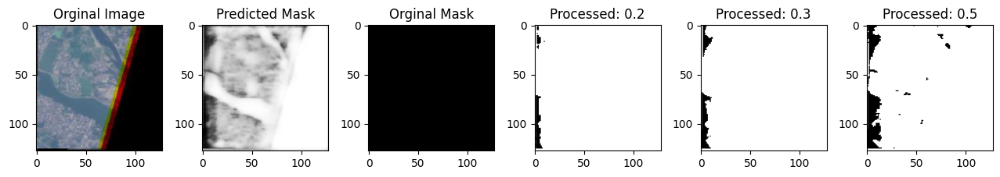

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7193 - loss: 0.2993 - val_accuracy: 0.7216 - val_loss: 0.2886
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7245 - loss: 0.286


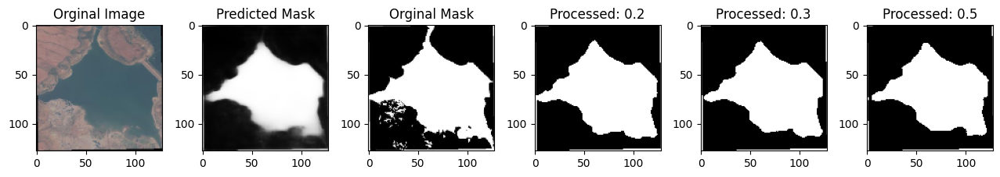

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7244 - loss: 0.2862 - val_accuracy: 0.7196 - val_loss: 0.2955
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7262 - loss: 0.285


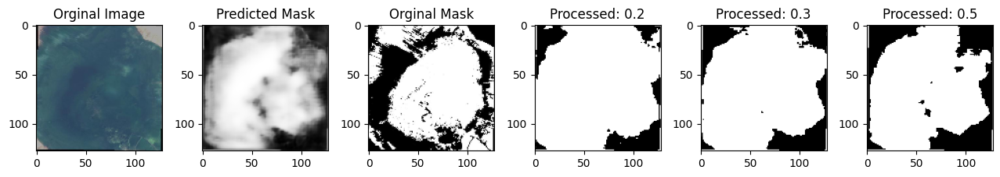

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7261 - loss: 0.2854 - val_accuracy: 0.7235 - val_loss: 0.2857
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7298 - loss: 0.271


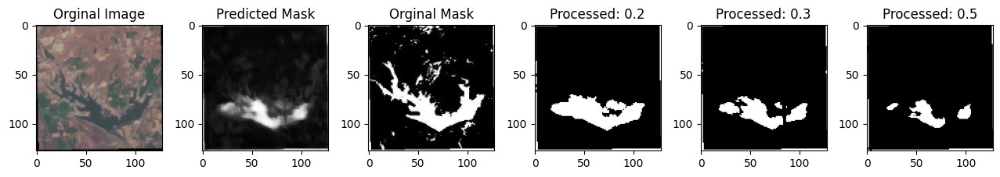

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7297 - loss: 0.2711 - val_accuracy: 0.7253 - val_loss: 0.2899
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7295 - loss: 0.277


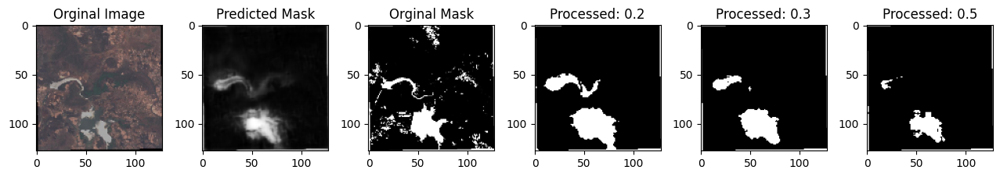

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7294 - loss: 0.2780 - val_accuracy: 0.7266 - val_loss: 0.2759
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7223 - loss: 0.279


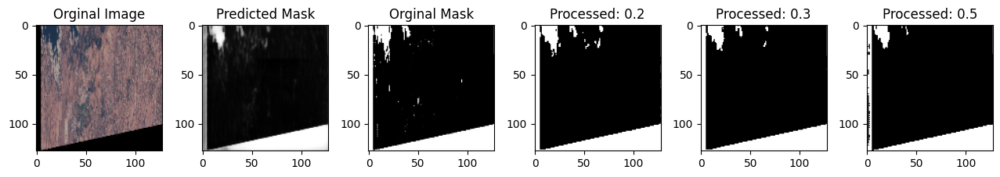

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7224 - loss: 0.2792 - val_accuracy: 0.7294 - val_loss: 0.2716
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7280 - loss: 0.273


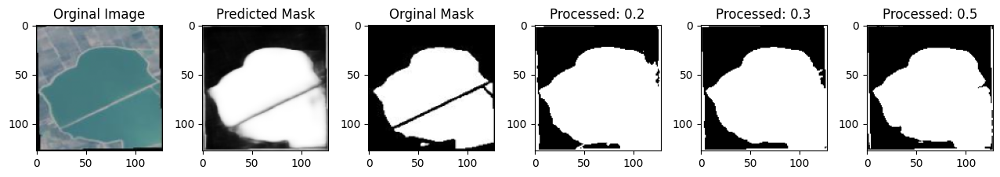

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7280 - loss: 0.2730 - val_accuracy: 0.7299 - val_loss: 0.2698
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7333 - loss: 0.270


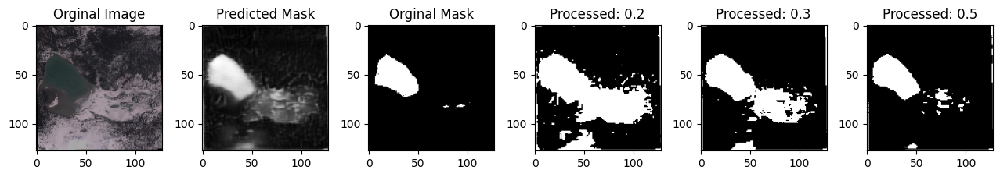

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7332 - loss: 0.2704 - val_accuracy: 0.7292 - val_loss: 0.2681
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7333 - loss: 0.271


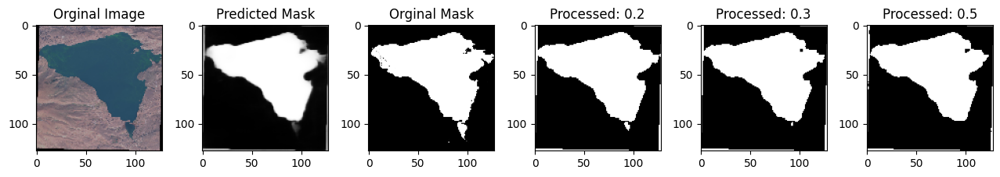

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7333 - loss: 0.2710 - val_accuracy: 0.7257 - val_loss: 0.2758
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7307 - loss: 0.271


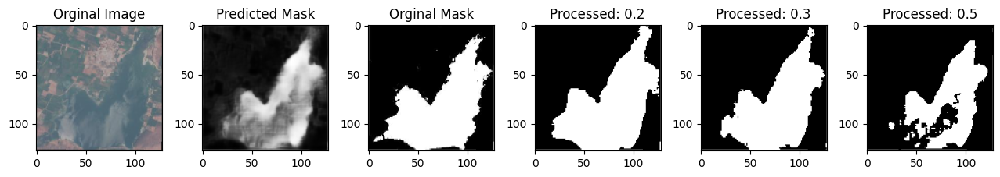

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7307 - loss: 0.2709 - val_accuracy: 0.7303 - val_loss: 0.2727
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7388 - loss: 0.254


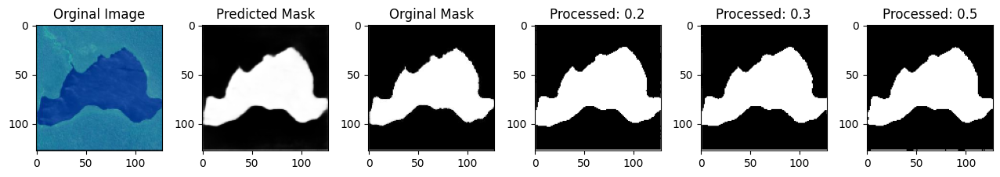

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7388 - loss: 0.2546 - val_accuracy: 0.7299 - val_loss: 0.2712
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7339 - loss: 0.256


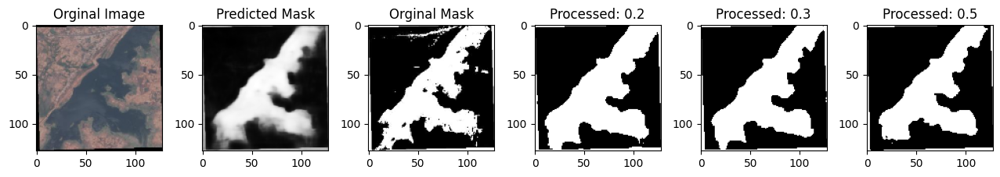

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7340 - loss: 0.2560 - val_accuracy: 0.7333 - val_loss: 0.2617
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7406 - loss: 0.252


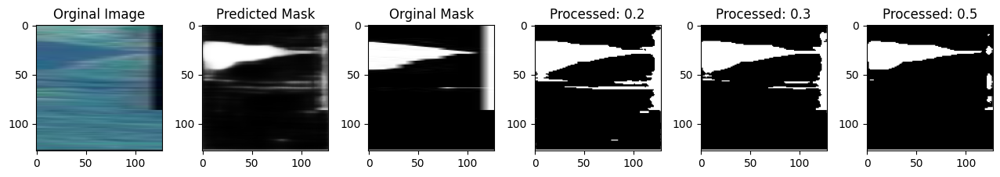

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7406 - loss: 0.2521 - val_accuracy: 0.7316 - val_loss: 0.2715
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7242 - loss: 0.276


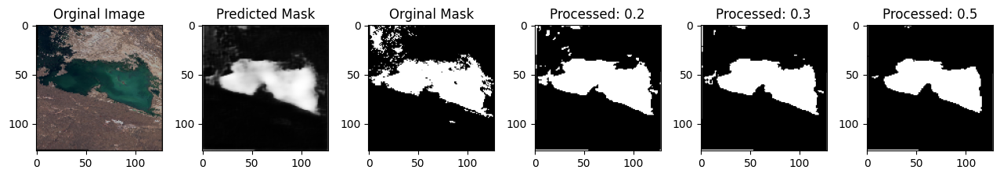

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7243 - loss: 0.2763 - val_accuracy: 0.7280 - val_loss: 0.2847
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7313 - loss: 0.267


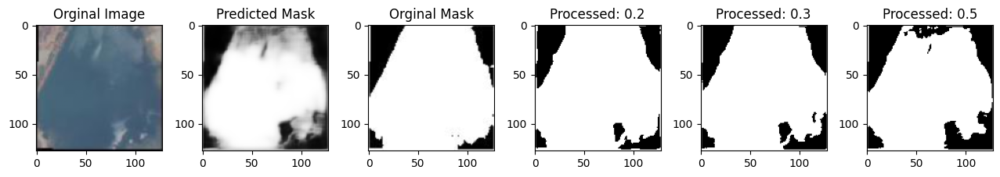

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7313 - loss: 0.2675 - val_accuracy: 0.7341 - val_loss: 0.2614
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7363 - loss: 0.252


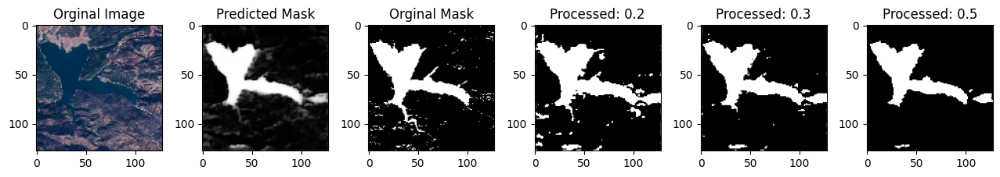

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7363 - loss: 0.2528 - val_accuracy: 0.7337 - val_loss: 0.2687
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7410 - loss: 0.248


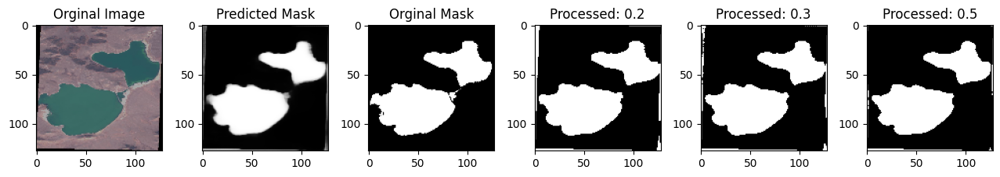

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7410 - loss: 0.2489 - val_accuracy: 0.7353 - val_loss: 0.2739
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7346 - loss: 0.254


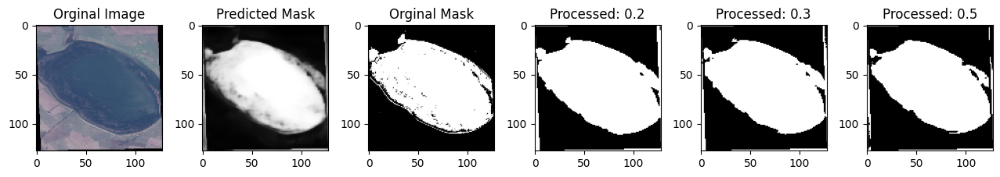

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7347 - loss: 0.2545 - val_accuracy: 0.7322 - val_loss: 0.2597
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7408 - loss: 0.241


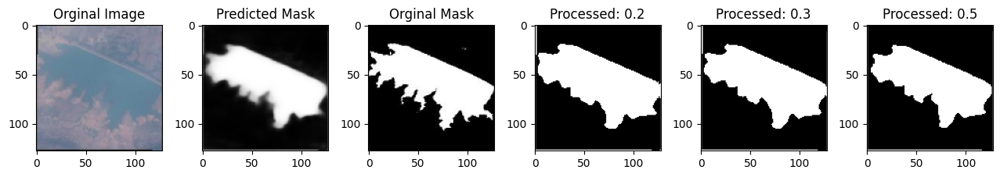

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7408 - loss: 0.2411 - val_accuracy: 0.7290 - val_loss: 0.2703
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7378 - loss: 0.252


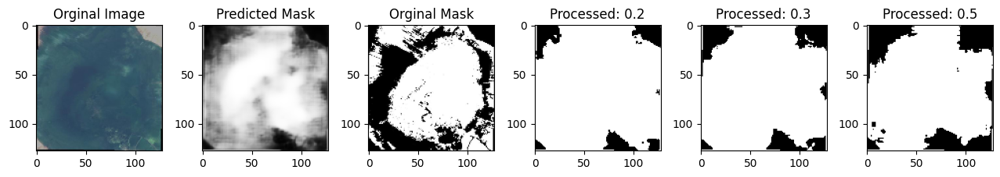

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7379 - loss: 0.2519 - val_accuracy: 0.7290 - val_loss: 0.2950
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7431 - loss: 0.238


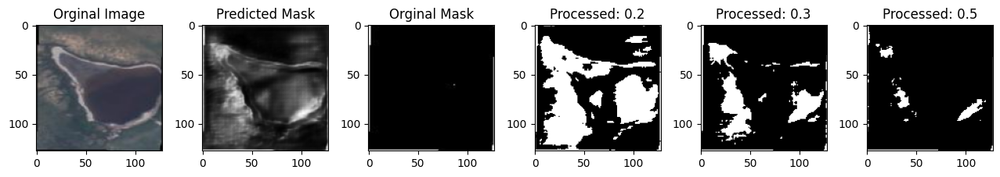

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7430 - loss: 0.2381 - val_accuracy: 0.7338 - val_loss: 0.2572
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7483 - loss: 0.233


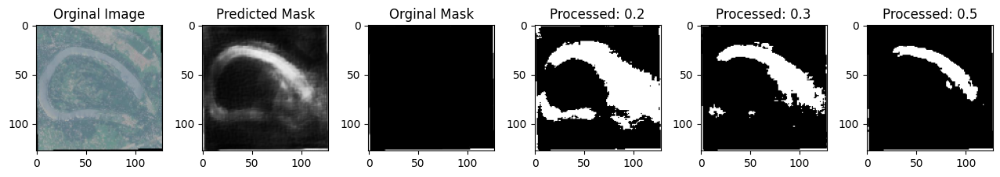

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7482 - loss: 0.2340 - val_accuracy: 0.7306 - val_loss: 0.2734
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7414 - loss: 0.242


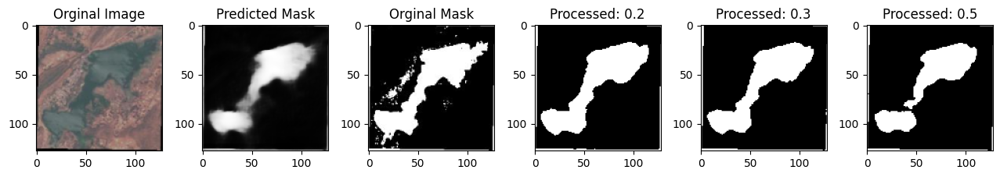

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7413 - loss: 0.2421 - val_accuracy: 0.7330 - val_loss: 0.2859
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7347 - loss: 0.249


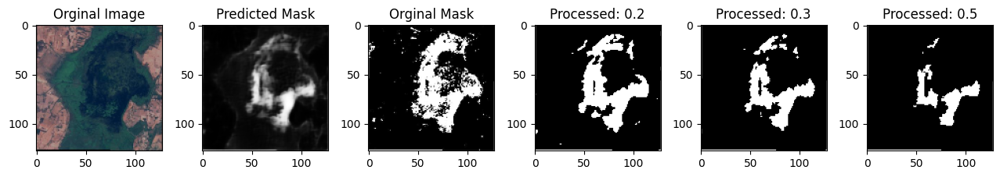

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7347 - loss: 0.2493 - val_accuracy: 0.7313 - val_loss: 0.2671
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7425 - loss: 0.244


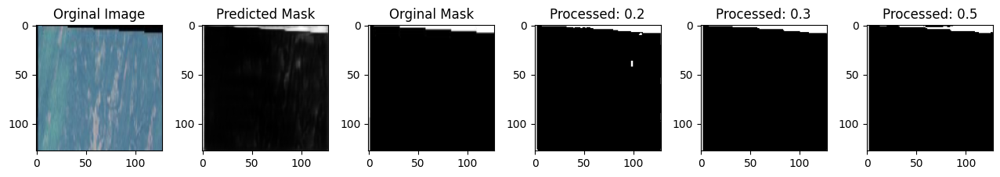

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7424 - loss: 0.2442 - val_accuracy: 0.7333 - val_loss: 0.2781
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7375 - loss: 0.238


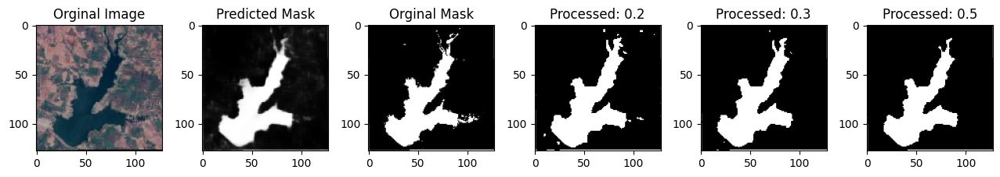

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7375 - loss: 0.2381 - val_accuracy: 0.7368 - val_loss: 0.2560
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7418 - loss: 0.237


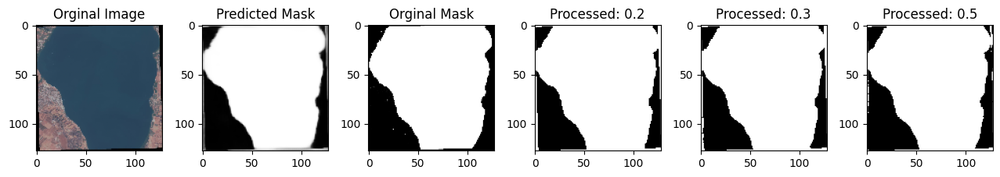

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7418 - loss: 0.2377 - val_accuracy: 0.7341 - val_loss: 0.2613
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7416 - loss: 0.235


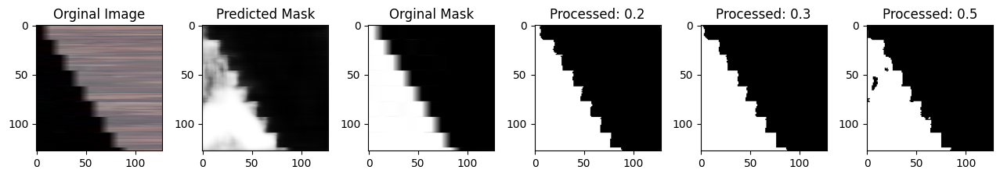

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7417 - loss: 0.2355 - val_accuracy: 0.7305 - val_loss: 0.2870
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7463 - loss: 0.235


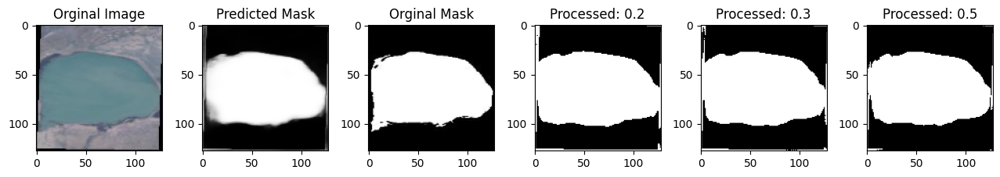

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7463 - loss: 0.2350 - val_accuracy: 0.7382 - val_loss: 0.2575
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7488 - loss: 0.218


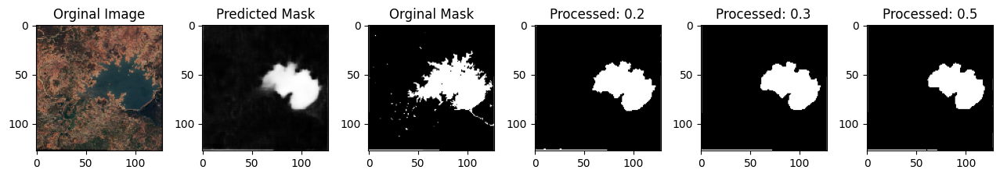

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7487 - loss: 0.2191 - val_accuracy: 0.7348 - val_loss: 0.2641
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.7471 - loss: 0.230


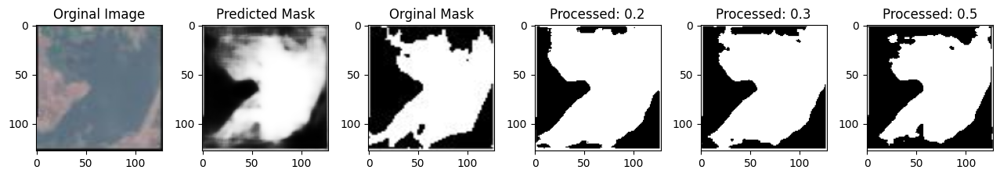

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7470 - loss: 0.2302 - val_accuracy: 0.7367 - val_loss: 0.2534
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7490 - loss: 0.226


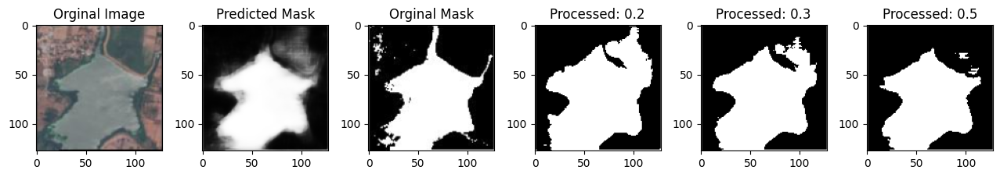

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - accuracy: 0.7490 - loss: 0.2267 - val_accuracy: 0.7377 - val_loss: 0.2535
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7473 - loss: 0.227


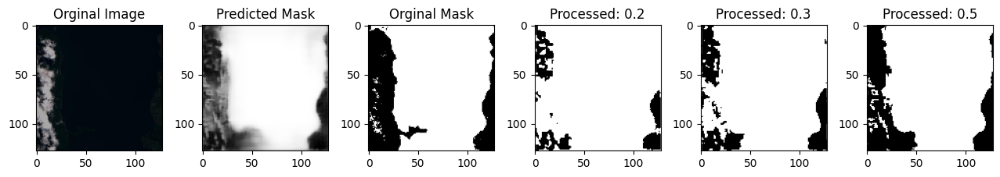

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7473 - loss: 0.2270 - val_accuracy: 0.7375 - val_loss: 0.2522
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7514 - loss: 0.221


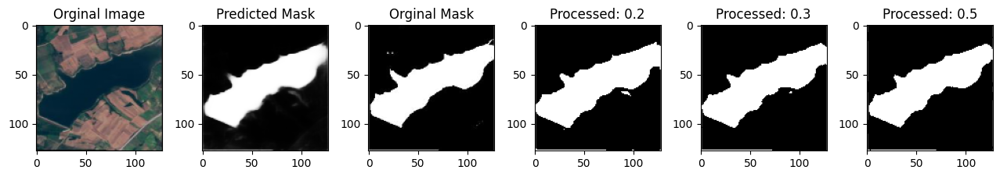

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7513 - loss: 0.2218 - val_accuracy: 0.7351 - val_loss: 0.2677
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.7497 - loss: 0.218


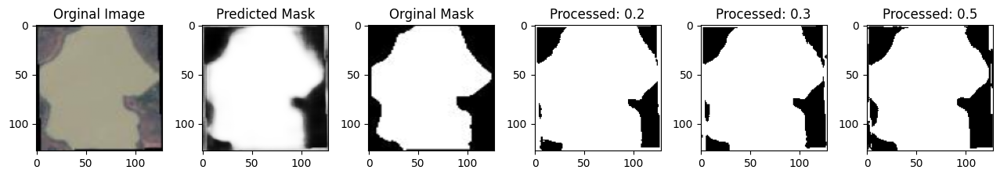

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7496 - loss: 0.2188 - val_accuracy: 0.7247 - val_loss: 0.2968
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7454 - loss: 0.245


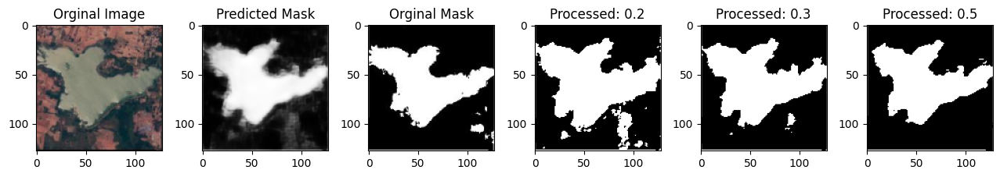

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7453 - loss: 0.2453 - val_accuracy: 0.7352 - val_loss: 0.2613
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7444 - loss: 0.225


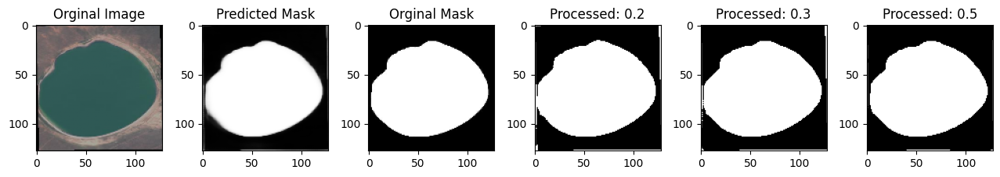

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7444 - loss: 0.2255 - val_accuracy: 0.7383 - val_loss: 0.2552
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7560 - loss: 0.212


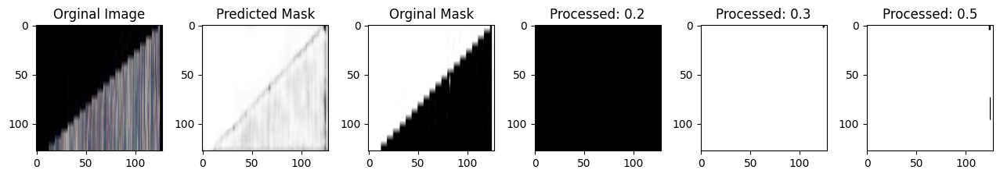

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7559 - loss: 0.2124 - val_accuracy: 0.7395 - val_loss: 0.2510
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7483 - loss: 0.228


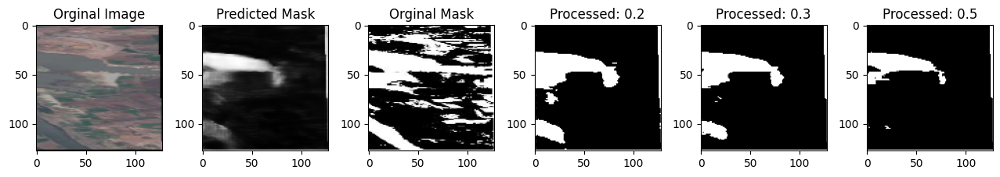

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7483 - loss: 0.2280 - val_accuracy: 0.7349 - val_loss: 0.2589
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7430 - loss: 0.235


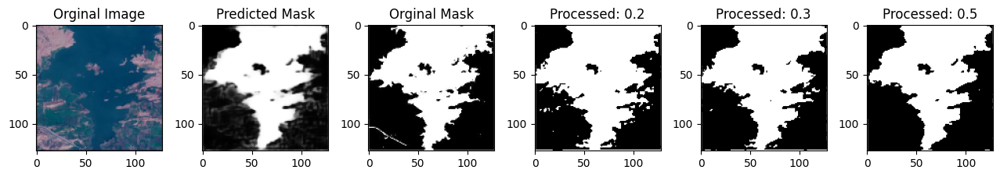

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7430 - loss: 0.2351 - val_accuracy: 0.7351 - val_loss: 0.2691
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7469 - loss: 0.219


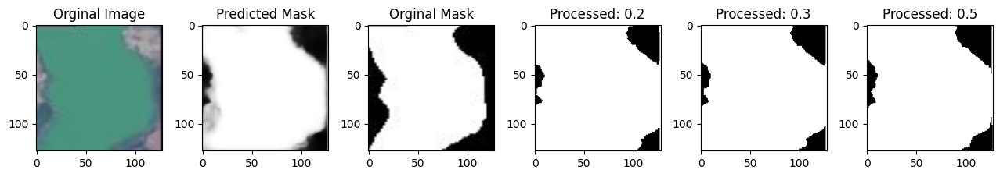

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7469 - loss: 0.2199 - val_accuracy: 0.7375 - val_loss: 0.2583
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7516 - loss: 0.215


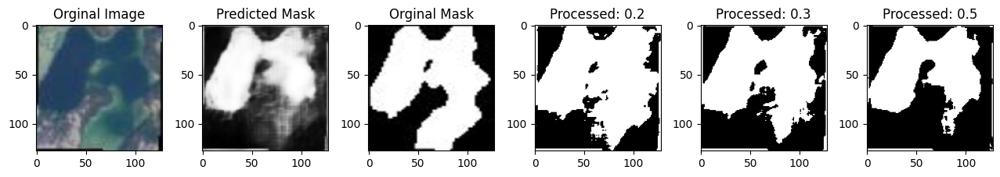

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 266ms/step - accuracy: 0.7516 - loss: 0.2158 - val_accuracy: 0.7378 - val_loss: 0.2602
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.7539 - loss: 0.210


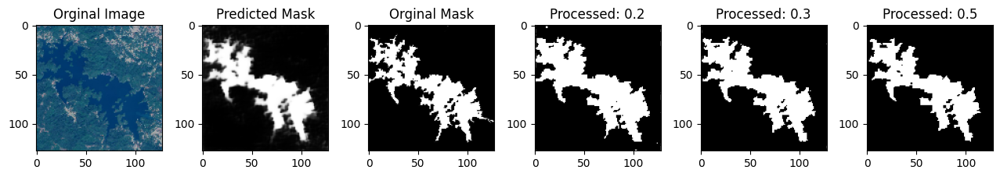

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7539 - loss: 0.2101 - val_accuracy: 0.7371 - val_loss: 0.2516
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7516 - loss: 0.224


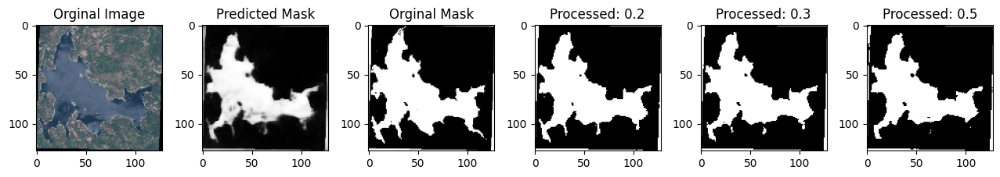

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 267ms/step - accuracy: 0.7515 - loss: 0.2242 - val_accuracy: 0.7398 - val_loss: 0.2546
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7455 - loss: 0.226


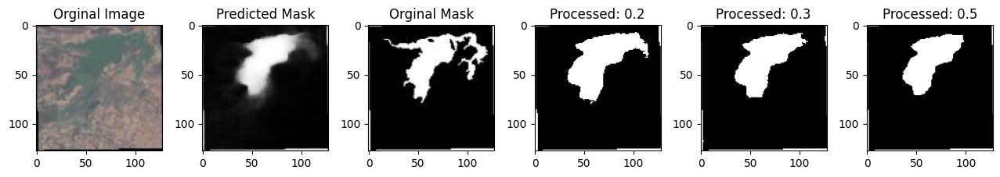

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7456 - loss: 0.2262 - val_accuracy: 0.7392 - val_loss: 0.2489
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7446 - loss: 0.222


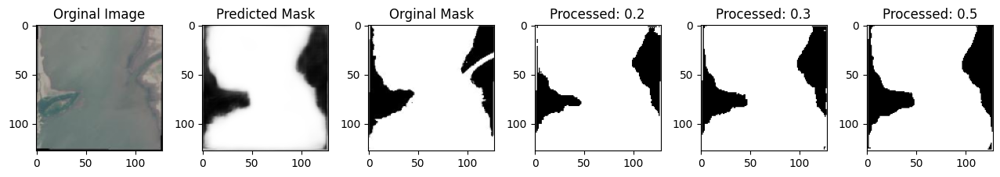

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7447 - loss: 0.2220 - val_accuracy: 0.7385 - val_loss: 0.2523
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7532 - loss: 0.214


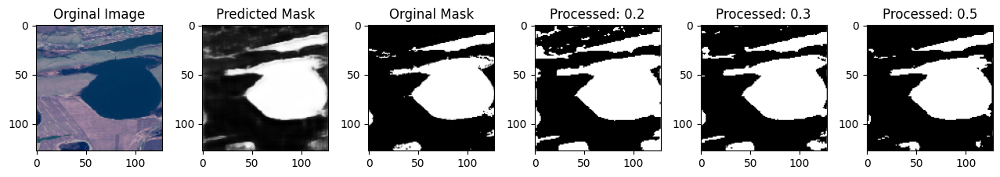

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7531 - loss: 0.2145 - val_accuracy: 0.7093 - val_loss: 0.3354
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7267 - loss: 0.291


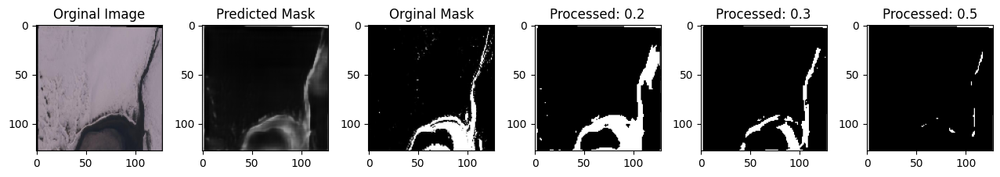

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7268 - loss: 0.2914 - val_accuracy: 0.7346 - val_loss: 0.2672
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7402 - loss: 0.248


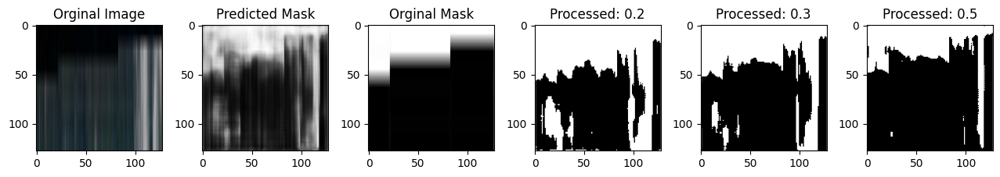

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7402 - loss: 0.2486 - val_accuracy: 0.7327 - val_loss: 0.2625
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7457 - loss: 0.229


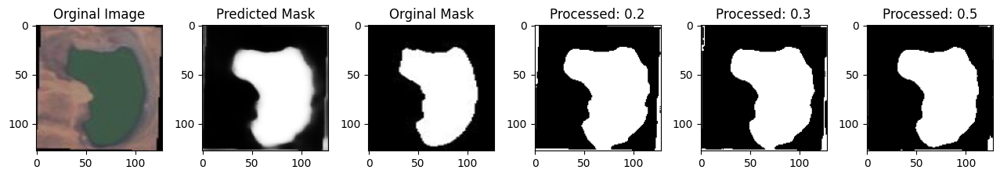

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7457 - loss: 0.2297 - val_accuracy: 0.7338 - val_loss: 0.2708
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7363 - loss: 0.239


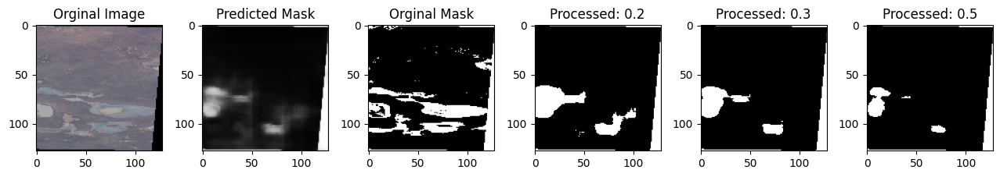

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7364 - loss: 0.2393 - val_accuracy: 0.7364 - val_loss: 0.2738
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/steptep - accuracy: 0.7526 - loss: 0.229


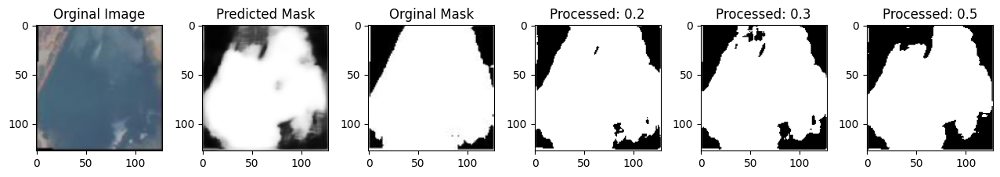

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7525 - loss: 0.2290 - val_accuracy: 0.7380 - val_loss: 0.2559
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7521 - loss: 0.208


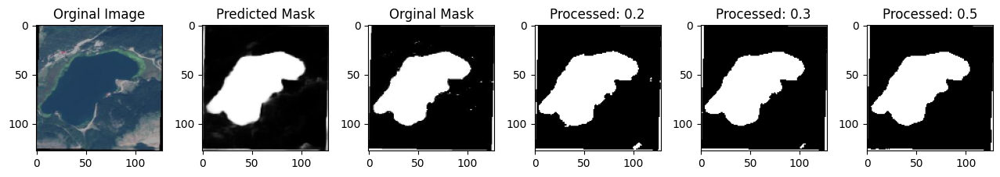

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7521 - loss: 0.2085 - val_accuracy: 0.7383 - val_loss: 0.2615
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7441 - loss: 0.223


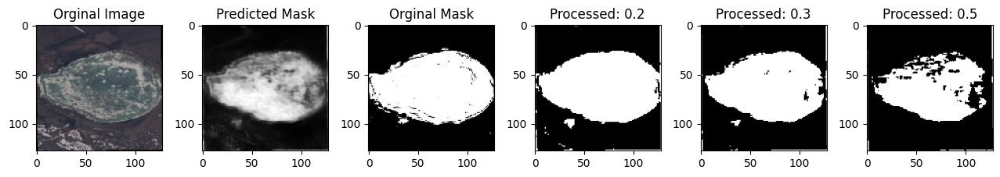

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 263ms/step - accuracy: 0.7442 - loss: 0.2231 - val_accuracy: 0.7388 - val_loss: 0.2543
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7403 - loss: 0.225


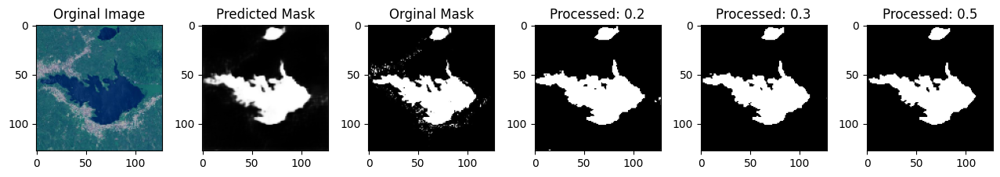

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7404 - loss: 0.2251 - val_accuracy: 0.7373 - val_loss: 0.2529
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7494 - loss: 0.210


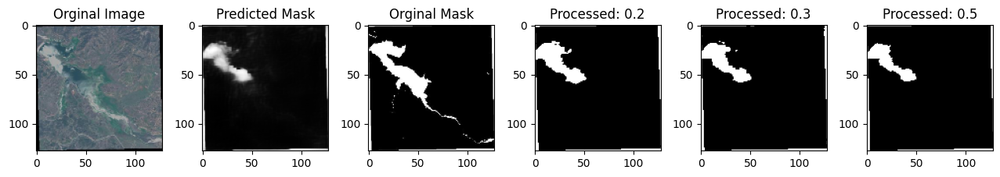

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7494 - loss: 0.2105 - val_accuracy: 0.7378 - val_loss: 0.2795
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7588 - loss: 0.215


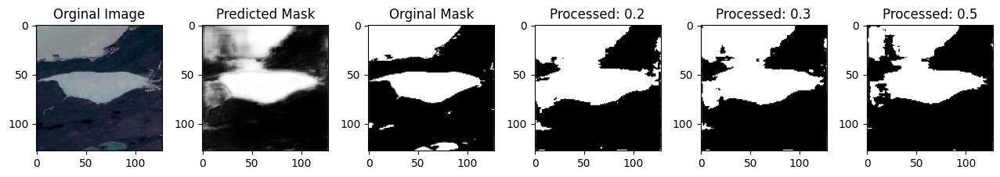

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7587 - loss: 0.2153 - val_accuracy: 0.7386 - val_loss: 0.2614
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/steptep - accuracy: 0.7524 - loss: 0.211


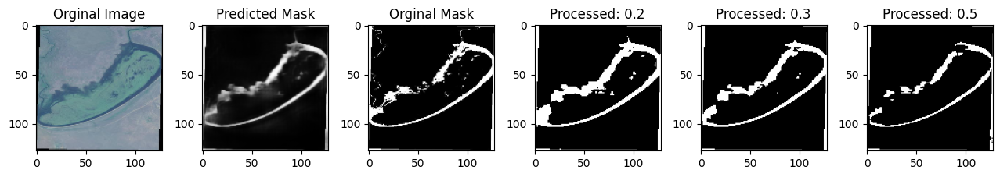

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - accuracy: 0.7523 - loss: 0.2119 - val_accuracy: 0.7408 - val_loss: 0.2535
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/steptep - accuracy: 0.7491 - loss: 0.221


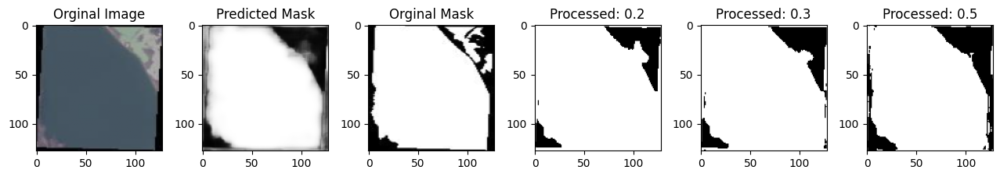

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - accuracy: 0.7491 - loss: 0.2211 - val_accuracy: 0.7350 - val_loss: 0.2619


In [15]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    validation_data=[images_test, mask_test], 
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [16]:
model.save('models/11-15.keras') 

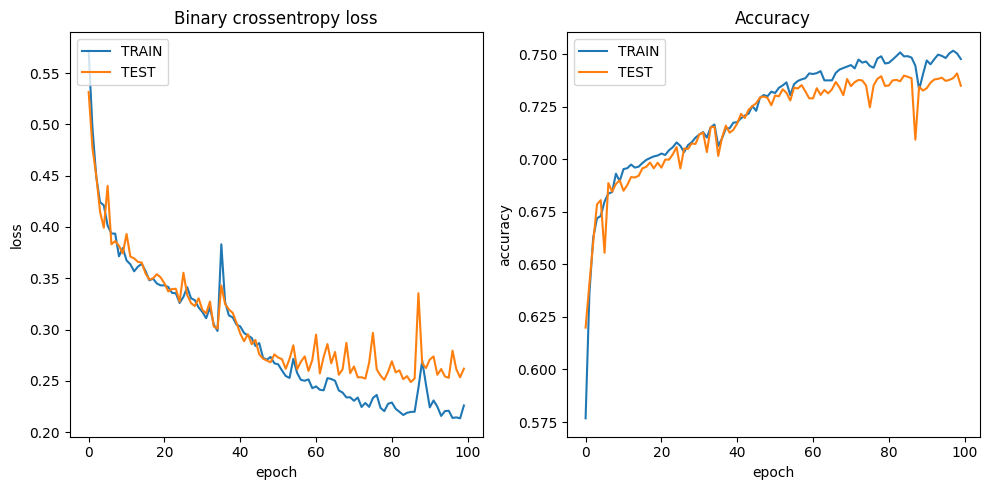

In [18]:
plt.figure(figsize=(10,5))

# Plot loss for each epoch
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label="Train loss")
plt.plot(history.history['val_loss'], label="Test loss")
plt.title('Binary crossentropy loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

# Plot accuracy for each epoch
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label="Train accuracy")
plt.plot(history.history['val_accuracy'], label="Test accuracy")
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

plt.tight_layout()
plt.show()

In [19]:
# Make predictions
predictions = model.predict(images_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step


In [20]:
def plot_results(threshold=0.5):
    k = np.random.randint(len(images_test))
    original_image = images_test[k]
    mask = mask_test[k].reshape(128,128)
    predicted_mask = predictions[k].reshape(128,128)
    threshold_mask = mask_threshold(predicted_mask, threshold=threshold)

    plt.figure(figsize=(15,5))

    plt.subplot(1,4,1)
    plt.imshow(original_image);plt.title('Orginal Image')

    plt.subplot(1,4,2)
    plt.imshow(mask, cmap='gray');plt.title('Original Mask')

    plt.subplot(1,4,3)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,4,4)
    plt.imshow(threshold_mask, cmap='gray');plt.title(f'Predicted Mask with cutoff={threshold}')

    plt.tight_layout()
    plt.show()

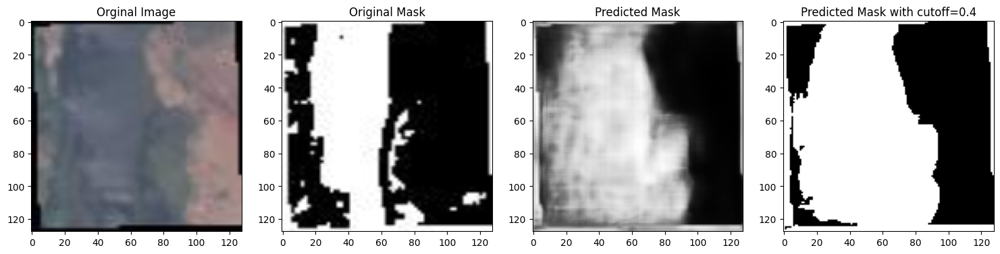

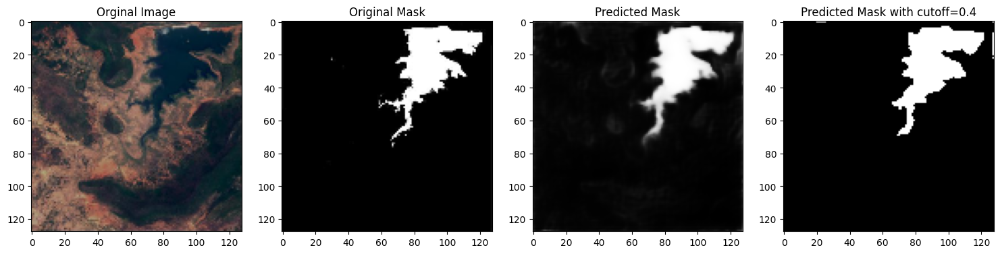

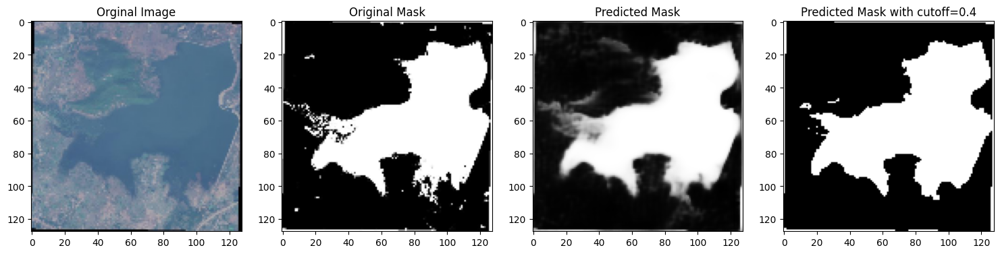

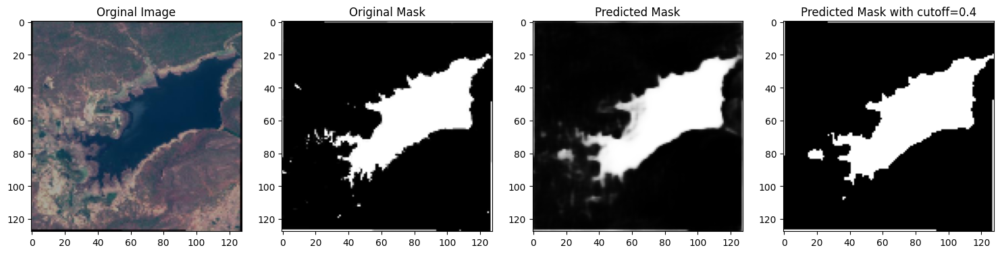

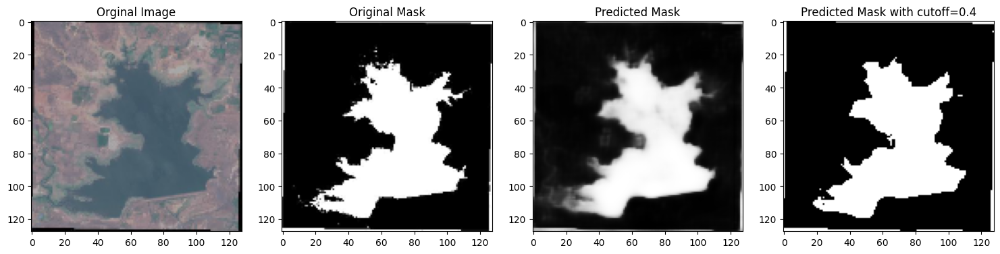

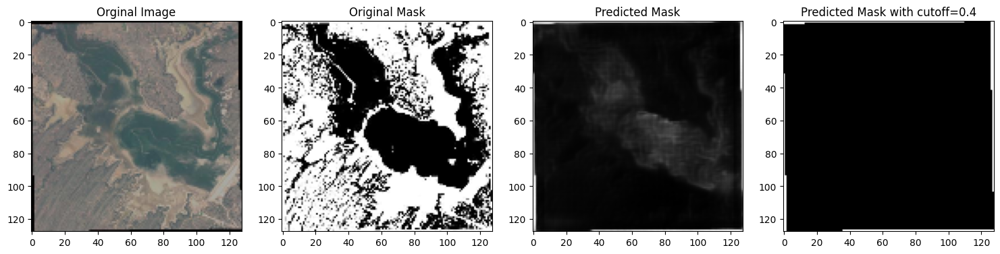

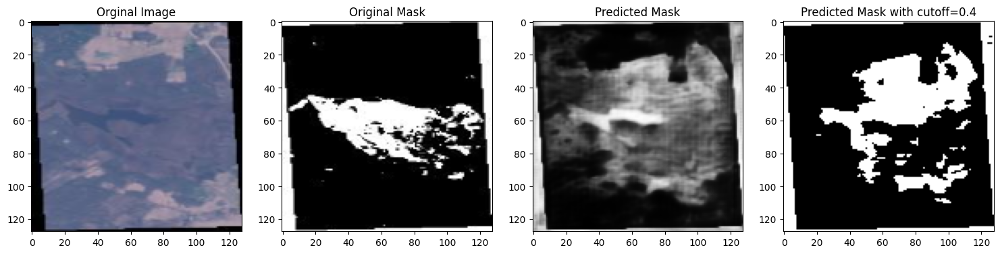

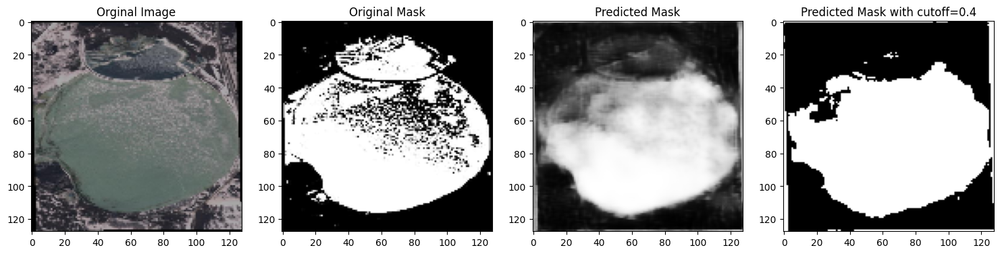

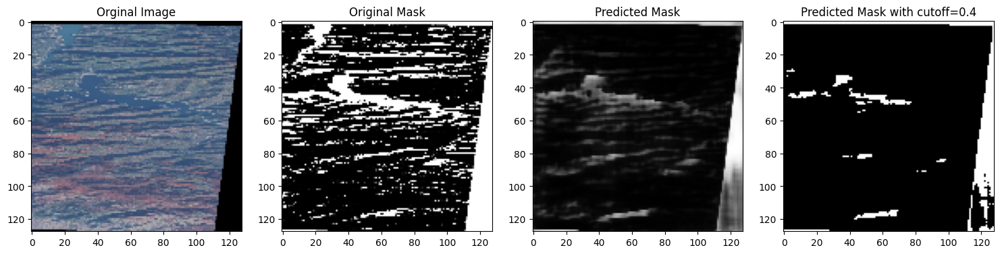

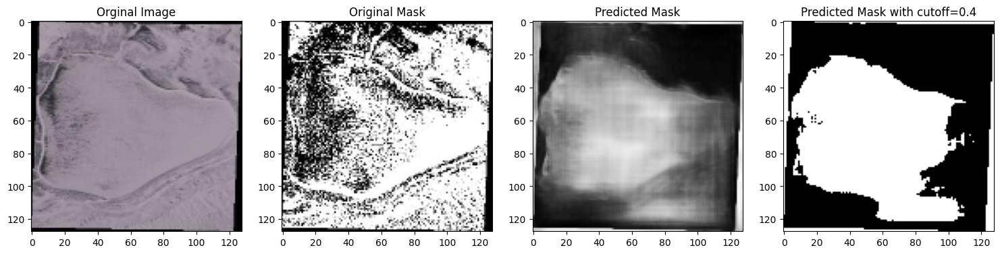

In [21]:
# Plot results on test data
for i in range(10):
  plot_results(threshold=0.4)